# 02. Normalize, cluster, and inspect retinal marker genes

This notebook continues from `data/interim/01_qc_merged.h5ad` and follows the reference notebook structure:

- optional Scrublet doublet scoring
- total-count normalization and log transform
- highly variable gene selection with `n_top_genes=2000`
- scaling, PCA, neighbor graph, UMAP
- Leiden clustering at resolutions `0.1`, `0.3`, and `0.5`
- marker-gene inspection for major retinal cell classes

The output is saved as `data/interim/02_clustered.h5ad`.

## Imports

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False)
sns.set_style("whitegrid")

/var/folders/bw/h94700p51374zgrbzwg8hrbh0000gn/T/ipykernel_16656/2618615243.py:8: FutureWarning: Use `scanpy.set_figure_params` instead
  sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False)


## Resolve project paths

In [2]:
def find_project_root(start: Path) -> Path:
    for candidate in [start, *start.parents]:
        if (candidate / "config" / "samples.csv").exists() and (candidate / "data").exists():
            return candidate
    raise FileNotFoundError("Could not find project root containing config/samples.csv")


PROJECT_ROOT = find_project_root(Path.cwd().resolve())
INTERIM_DIR = PROJECT_ROOT / "data" / "interim"
RESULTS_CLUSTERING_DIR = PROJECT_ROOT / "results" / "clustering"
FIGURES_DIR = PROJECT_ROOT / "results" / "figures"

INPUT_H5AD = INTERIM_DIR / "01_qc_merged.h5ad"
OUTPUT_H5AD = INTERIM_DIR / "02_clustered.h5ad"

RESULTS_CLUSTERING_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

print(f"Project root: {PROJECT_ROOT}")
print(f"Input object: {INPUT_H5AD}")

Project root: /Users/louis/Desktop/lab/code/scrna/retina_scRNA_TH1_TH2
Input object: /Users/louis/Desktop/lab/code/scrna/retina_scRNA_TH1_TH2/data/interim/01_qc_merged.h5ad


## Load QC-filtered merged object

In [3]:
adata = sc.read_h5ad(INPUT_H5AD)
adata

AnnData object with n_obs × n_vars = 37729 × 32286
    obs: 'sample_id', 'condition', 'raw_matrix_dir', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt'
    layers: 'counts'

In [4]:
adata.obs[["sample_id", "condition"]].value_counts().sort_index()

sample_id  condition
TH1        Control      13515
TH2        Insm1_KO     24214
Name: count, dtype: int64

## Doublet scoring with Scrublet

This matches the reference notebook's `sc.pp.scrublet(..., batch_key=...)` step. If your Scanpy install is missing optional Scrublet dependencies, install them and rerun this cell.

In [5]:
sc.pp.scrublet(adata, batch_key="sample_id")
adata.obs[["doublet_score", "predicted_doublet"]].describe(include="all")

,doublet_score,predicted_doublet
count,37729.000000,37729
unique,NaN,2
top,NaN,False
freq,NaN,37728
mean,0.072614,NaN
std,0.071473,NaN
min,0.001285,NaN
25%,0.023464,NaN
50%,0.052493,NaN
75%,0.095696,NaN


## Normalize and log-transform

In [6]:
if "counts" not in adata.layers:
    adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 37729 × 32286
    obs: 'sample_id', 'condition', 'raw_matrix_dir', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'mt'
    uns: 'scrublet', 'log1p'
    layers: 'counts'

## Highly variable genes

The reference notebook uses `n_top_genes=2000` and batches by sample.

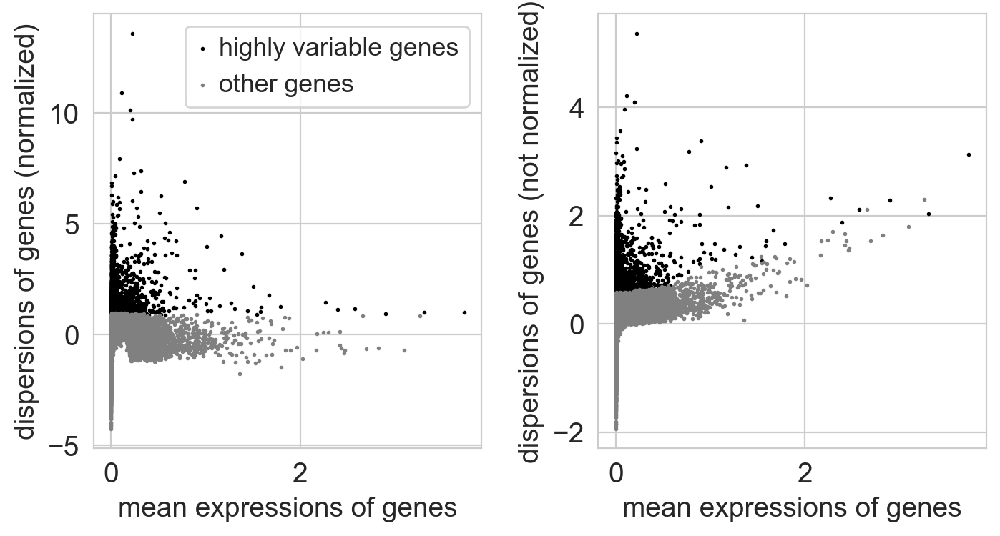

In [7]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample_id")
sc.pl.highly_variable_genes(adata)

In [8]:
adata.var["highly_variable"].value_counts()

highly_variable
False    30286
True      2000
Name: count, dtype: int64

## Scale and PCA

In [9]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata)
adata

/opt/homebrew/Cellar/python@3.12/3.12.13/Frameworks/Python.framework/Versions/3.12/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


AnnData object with n_obs × n_vars = 37729 × 32286
    obs: 'sample_id', 'condition', 'raw_matrix_dir', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

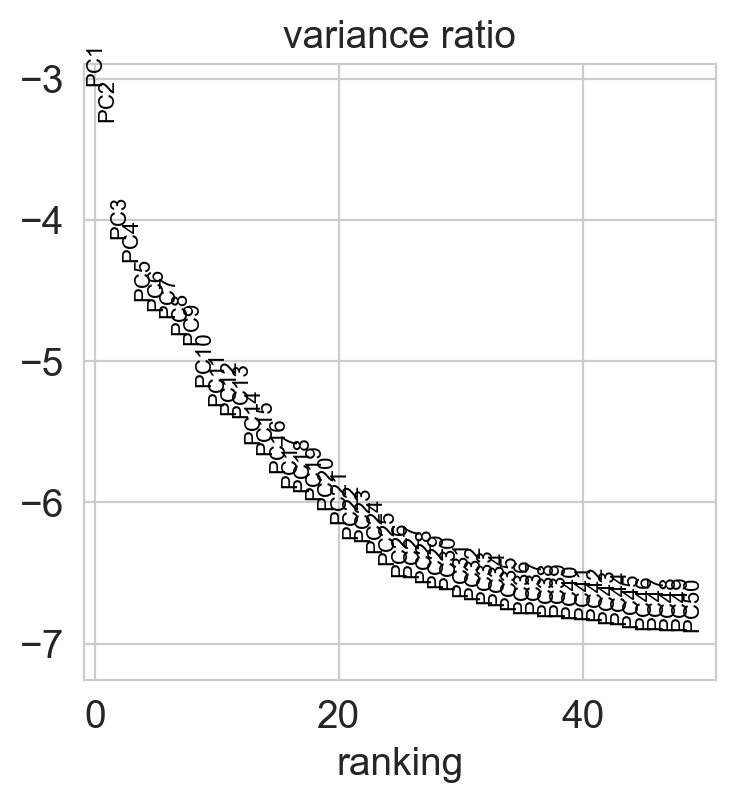

In [10]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

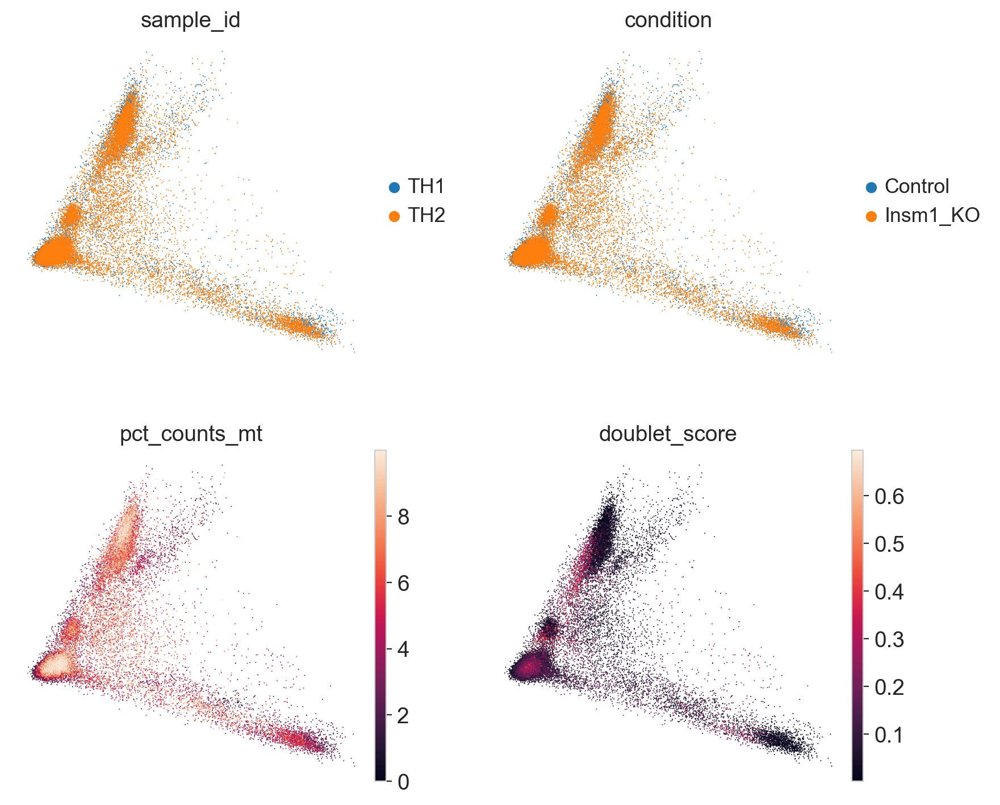

In [11]:
sc.pl.pca(
    adata,
    color=["sample_id", "condition", "pct_counts_mt", "doublet_score"],
    dimensions=[(0, 1), (0, 1), (0, 1), (0, 1)],
    ncols=2,
    size=2,
)

## Neighbors, UMAP, and Leiden clustering
note: version maters

In [12]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata

/Users/louis/Desktop/lab/code/scrna/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


AnnData object with n_obs × n_vars = 37729 × 32286
    obs: 'sample_id', 'condition', 'raw_matrix_dir', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca', 'sample_id_colors', 'condition_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [13]:
for res in [0.1, 0.3, 0.5]:
    sc.tl.leiden(
        adata,
        key_added=f"leiden_res_{res:4.2f}",
        resolution=res,
        flavor="igraph",
        n_iterations=2,
    )

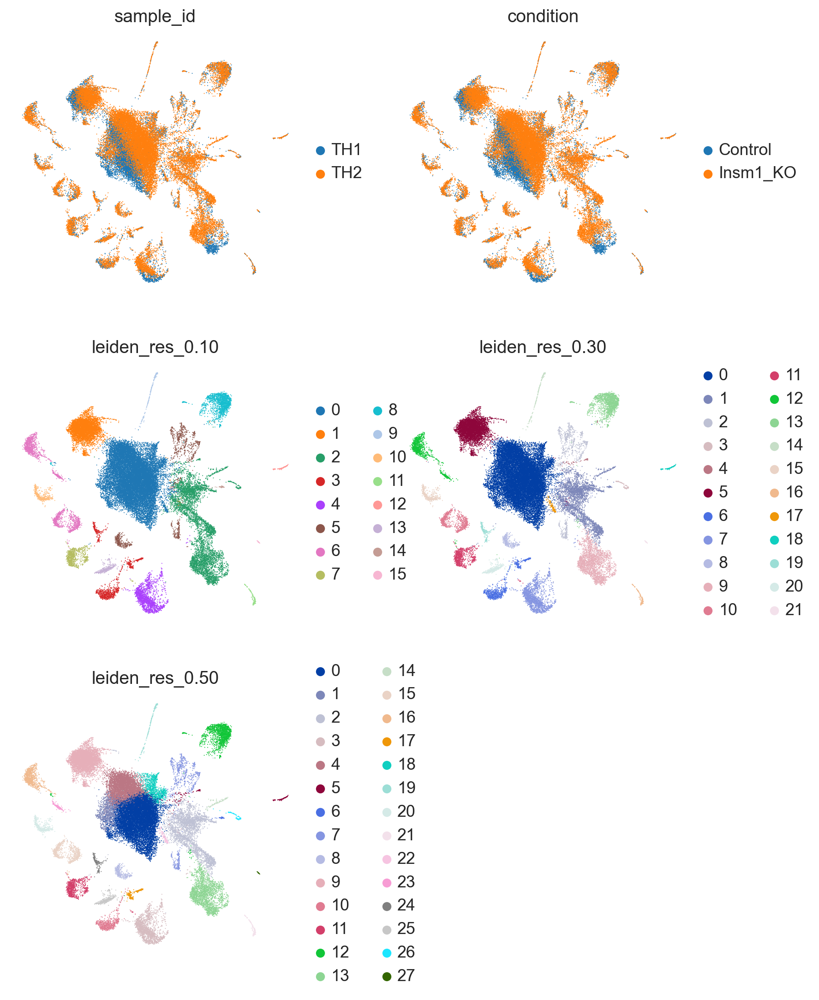

In [14]:
sc.pl.umap(
    adata,
    color=["sample_id", "condition", "leiden_res_0.10", "leiden_res_0.30", "leiden_res_0.50"],
    ncols=2,
    size=2,
)

## Re-assess QC and doublet scores on UMAP

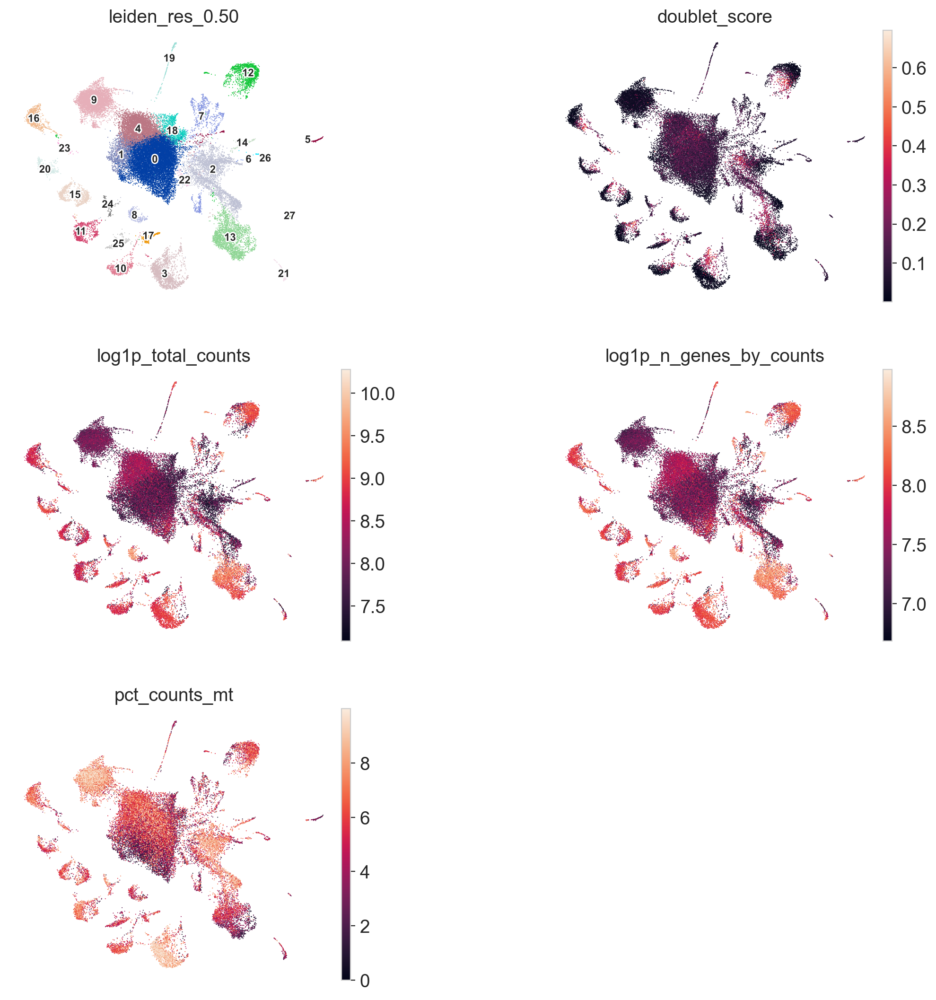

In [15]:
sc.pl.umap(
    adata,
    color=[
        "leiden_res_0.50",
        "doublet_score",
        "log1p_total_counts",
        "log1p_n_genes_by_counts",
        "pct_counts_mt",
    ],
    legend_loc="on data",
    legend_fontsize=8,
    legend_fontoutline=2,
    ncols=2,
    wspace=0.5,
    size=2,
)


## QC distributions by cluster

These violin plots mirror the reference-style cluster QC plots. They show whether any Leiden cluster has unusually high or low UMI counts or detected genes, which can indicate low-quality clusters, doublet-enriched clusters, or biologically distinct high-complexity cell types.

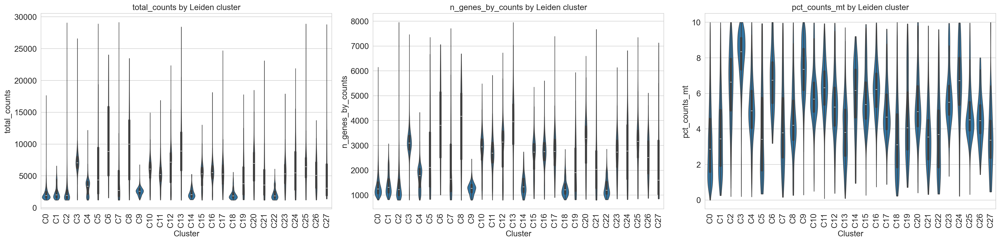

In [16]:
CLUSTER_KEY = "leiden_res_0.50"

qc_by_cluster = adata.obs[[CLUSTER_KEY, "total_counts", "n_genes_by_counts", "pct_counts_mt"]].copy()
qc_by_cluster["cluster_label"] = "C" + qc_by_cluster[CLUSTER_KEY].astype(str)

cluster_order = [
    f"C{cluster}"
    for cluster in sorted(
        qc_by_cluster[CLUSTER_KEY].astype(str).unique(),
        key=lambda value: int(value),
    )
]

fig, axes = plt.subplots(1, 3, figsize=(24, 6), sharex=False)

sns.violinplot(
    data=qc_by_cluster,
    x="cluster_label",
    y="total_counts",
    order=cluster_order,
    inner="box",
    cut=0,
    linewidth=0.8,
    ax=axes[0],
)
axes[0].set_title("total_counts by Leiden cluster")
axes[0].set_xlabel("Cluster")
axes[0].set_ylabel("total_counts")
axes[0].tick_params(axis="x", rotation=90)

sns.violinplot(
    data=qc_by_cluster,
    x="cluster_label",
    y="n_genes_by_counts",
    order=cluster_order,
    inner="box",
    cut=0,
    linewidth=0.8,
    ax=axes[1],
)
axes[1].set_title("n_genes_by_counts by Leiden cluster")
axes[1].set_xlabel("Cluster")
axes[1].set_ylabel("n_genes_by_counts")
axes[1].tick_params(axis="x", rotation=90)

sns.violinplot(
    data=qc_by_cluster,
    x="cluster_label",
    y="pct_counts_mt",
    order=cluster_order,
    inner="box",
    cut=0,
    linewidth=0.8,
    ax=axes[2],
)
axes[2].set_title("pct_counts_mt by Leiden cluster")
axes[2].set_xlabel("Cluster")
axes[2].set_ylabel("pct_counts_mt")
axes[2].tick_params(axis="x", rotation=90)

plt.tight_layout()
plt.show()

In [17]:
cluster_qc_summary = (
    adata.obs
    .groupby(CLUSTER_KEY, observed=True)
    .agg(
        n_cells=("total_counts", "size"),
        median_total_counts=("total_counts", "median"),
        mean_total_counts=("total_counts", "mean"),
        median_n_genes=("n_genes_by_counts", "median"),
        mean_n_genes=("n_genes_by_counts", "mean"),
        median_pct_mt=("pct_counts_mt", "median"),
        mean_doublet_score=("doublet_score", "mean"),
    )
    .round(2)
)

cluster_qc_summary.to_csv(RESULTS_CLUSTERING_DIR / "02_cluster_qc_summary.csv")
cluster_qc_summary

,n_cells,median_total_counts,mean_total_counts,median_n_genes,mean_n_genes,median_pct_mt,mean_doublet_score
leiden_res_0.50,,,,,,,
0,11674,1907.0,2207.550049,1248.0,1367.20,2.86,0.08
1,1066,2028.0,2405.419922,1312.5,1434.24,3.44,0.06
2,3120,1904.0,2508.699951,1222.5,1446.36,6.63,0.10
3,1706,7066.0,6995.879883,3094.5,3053.71,8.35,0.07
4,4755,3377.0,3261.810059,1781.0,1719.53,5.02,0.10
5,199,4341.0,6740.299805,2110.0,2565.43,3.42,0.07
6,32,8830.0,10746.410156,3806.0,3859.62,6.74,0.08
7,757,2715.0,4685.629883,1639.0,2263.19,3.78,0.08
8,354,9972.5,9497.160156,4170.5,3821.42,4.21,0.08


## Detailed QC markers by cluster

This view is useful for manual cluster filtering. Low-quality clusters often show low `log1p_total_counts`, low `log1p_n_genes_by_counts`, high `pct_counts_mt`, or abnormal `Malat1` expression.

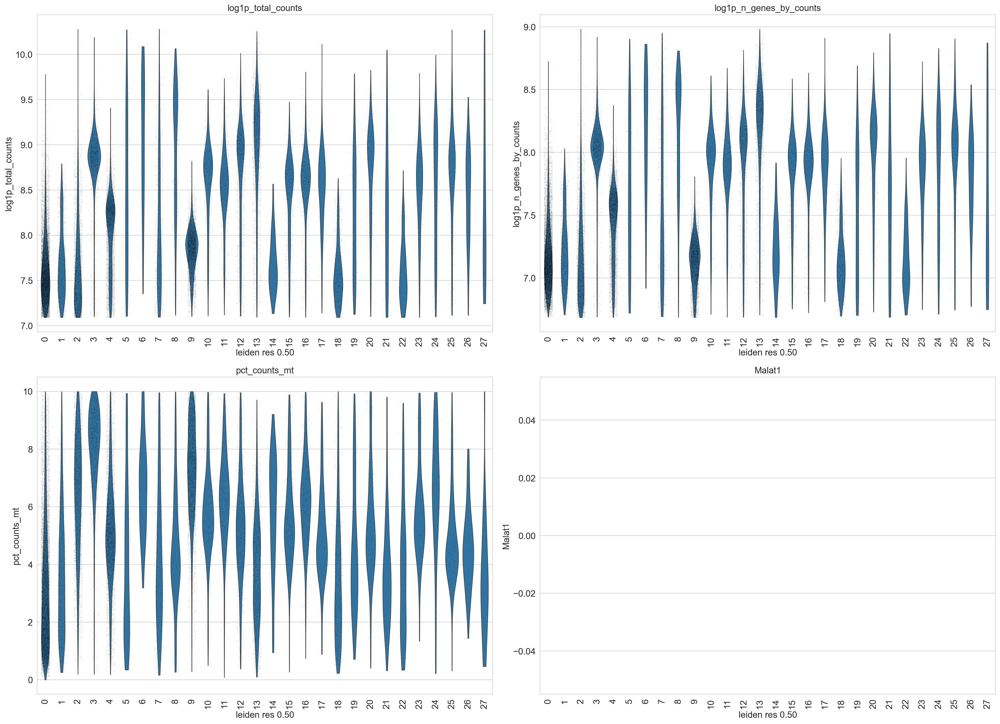

In [18]:
import scipy.sparse as sp


def get_gene_vector(adata, gene):
    values = adata[:, gene].X
    if sp.issparse(values):
        values = values.toarray()
    return values.ravel()


detailed_qc = adata.obs[[
    CLUSTER_KEY,
    "log1p_total_counts",
    "log1p_n_genes_by_counts",
    "pct_counts_mt",
]].copy()
detailed_qc["cluster_label"] = detailed_qc[CLUSTER_KEY].astype(str)

if "Malat1" in adata.var_names:
    detailed_qc["Malat1"] = get_gene_vector(adata, "Malat1")
else:
    print("Malat1 is not present in adata.var_names; skipping Malat1 panel.")

qc_metrics = [
    "log1p_total_counts",
    "log1p_n_genes_by_counts",
    "pct_counts_mt",
]
if "Malat1" in detailed_qc.columns:
    qc_metrics.append("Malat1")

fig, axes = plt.subplots(2, 2, figsize=(22, 16))
axes = axes.flatten()

for ax, metric in zip(axes, qc_metrics):
    sns.violinplot(
        data=detailed_qc,
        x="cluster_label",
        y=metric,
        order=[str(cluster).replace("C", "") for cluster in cluster_order],
        inner=None,
        cut=0,
        linewidth=0.8,
        ax=ax,
    )
    sns.stripplot(
        data=detailed_qc,
        x="cluster_label",
        y=metric,
        order=[str(cluster).replace("C", "") for cluster in cluster_order],
        color="black",
        size=0.6,
        alpha=0.35,
        jitter=0.25,
        ax=ax,
    )
    ax.set_title(metric)
    ax.set_xlabel(CLUSTER_KEY.replace("_", " "))
    ax.tick_params(axis="x", rotation=90)

for ax in axes[len(qc_metrics):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [19]:
cluster_filter_review = (
    detailed_qc
    .groupby(CLUSTER_KEY, observed=True)
    .agg(
        n_cells=("log1p_total_counts", "size"),
        median_log1p_total_counts=("log1p_total_counts", "median"),
        median_log1p_n_genes=("log1p_n_genes_by_counts", "median"),
        median_pct_mt=("pct_counts_mt", "median"),
        q75_pct_mt=("pct_counts_mt", lambda x: x.quantile(0.75)),
    )
)

if "Malat1" in detailed_qc.columns:
    malat1_summary = detailed_qc.groupby(CLUSTER_KEY, observed=True)["Malat1"].median().rename("median_Malat1")
    cluster_filter_review = cluster_filter_review.join(malat1_summary)

cluster_filter_review = cluster_filter_review.round(2)
cluster_filter_review["candidate_low_complexity"] = (
    cluster_filter_review["median_log1p_total_counts"] < cluster_filter_review["median_log1p_total_counts"].quantile(0.10)
) | (
    cluster_filter_review["median_log1p_n_genes"] < cluster_filter_review["median_log1p_n_genes"].quantile(0.10)
)
cluster_filter_review["candidate_high_mt"] = cluster_filter_review["median_pct_mt"] > 8

cluster_filter_review.to_csv(RESULTS_CLUSTERING_DIR / "02_cluster_manual_filter_review.csv")
cluster_filter_review

,n_cells,median_log1p_total_counts,median_log1p_n_genes,median_pct_mt,q75_pct_mt,median_Malat1,candidate_low_complexity,candidate_high_mt
leiden_res_0.50,,,,,,,,
0,11674,7.55,7.13,2.86,4.58,NaN,False,False
1,1066,7.62,7.18,3.44,5.06,NaN,False,False
2,3120,7.55,7.11,6.63,7.95,NaN,True,False
3,1706,8.86,8.04,8.35,9.12,NaN,False,True
4,4755,8.13,7.49,5.02,6.15,NaN,False,False
5,199,8.38,7.65,3.42,5.75,NaN,False,False
6,32,9.09,8.24,6.74,7.75,NaN,False,False
7,757,7.91,7.40,3.78,5.74,NaN,False,False
8,354,9.21,8.34,4.21,5.60,NaN,False,False


## Inspect retinal marker genes

In [20]:
marker_genes = {
    "Rod": ["Rho", "Gnat1", "Pde6a", "Pde6b", "Cnga1", "Nr2e3", "Nrl", "Prph2", "Rom1"],
    "Cone": ["Pde6h", "Arr3", "Opn1mw", "Gnat2", "Pde6c", "Opn1sw"],
    "BC": ["Vsx1", "Vsx2", "Car10", "Otx2os1", "Gng13", "Nrxn3", "Gabrb3", "Trnp1", "Kcnma1"],
    "AC": ["Tfap2a", "Tfap2b", "Pax6", "Elavl3", "Gad1", "Gad2"],
    "MG": ["Rlbp1", "Glul", "Dkk3", "Adamtsl1", "Gpr37", "Clu", "Apoe", "Aqp4", "Gfap"],
    "HC": ["Calb1", "Onecut1", "Slc4a3", "Onecut2", "C1ql1"],
    "RGC": ["Nefl", "Stmn2", "Nrn1", "Pou4f1", "Pou4f2", "Sncg", "Rbpms"],
    "RPE": ["Ttr", "Rdh5", "Rgr", "Slc16a8"],
    "Astrocyte": ["S100b", "Gfap", "Mlc1", "Prdx6", "Pdgfra"],
    "Microglia": ["Ctss", "C1qa", "Hexb", "Trem2"],
    "Endothelial": ["Cldn5", "Flt1", "Ly6c1", "Ptprb"],
}

available_marker_genes = {
    cell_type: [gene for gene in genes if gene in adata.var_names]
    for cell_type, genes in marker_genes.items()
}
available_marker_genes

{'Rod': ['Rho',
  'Gnat1',
  'Pde6a',
  'Pde6b',
  'Cnga1',
  'Nr2e3',
  'Nrl',
  'Prph2',
  'Rom1'],
 'Cone': ['Pde6h', 'Arr3', 'Opn1mw', 'Gnat2', 'Pde6c', 'Opn1sw'],
 'BC': ['Vsx1',
  'Vsx2',
  'Car10',
  'Otx2os1',
  'Gng13',
  'Nrxn3',
  'Gabrb3',
  'Trnp1',
  'Kcnma1'],
 'AC': ['Tfap2a', 'Tfap2b', 'Pax6', 'Elavl3', 'Gad1', 'Gad2'],
 'MG': ['Rlbp1',
  'Glul',
  'Dkk3',
  'Adamtsl1',
  'Gpr37',
  'Clu',
  'Apoe',
  'Aqp4',
  'Gfap'],
 'HC': ['Calb1', 'Onecut1', 'Slc4a3', 'Onecut2', 'C1ql1'],
 'RGC': ['Nefl', 'Stmn2', 'Nrn1', 'Pou4f1', 'Pou4f2', 'Sncg', 'Rbpms'],
 'RPE': ['Ttr', 'Rdh5', 'Rgr', 'Slc16a8'],
 'Astrocyte': ['S100b', 'Gfap', 'Mlc1', 'Prdx6', 'Pdgfra'],
 'Microglia': ['Ctss', 'C1qa', 'Hexb', 'Trem2'],
 'Endothelial': ['Cldn5', 'Flt1', 'Ly6c1', 'Ptprb']}

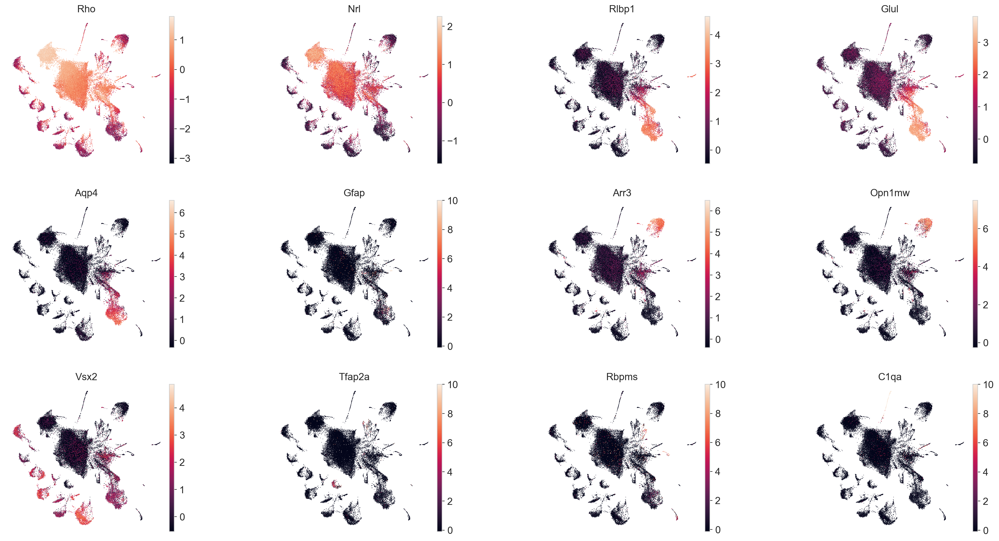

In [21]:
sc.pl.umap(
    adata,
    color=["Rho", "Nrl", "Rlbp1", "Glul", "Aqp4", "Gfap", "Arr3", "Opn1mw", "Vsx2", "Tfap2a", "Rbpms", "C1qa"],
    ncols=4,
    wspace=0.5,
    size=2,
)

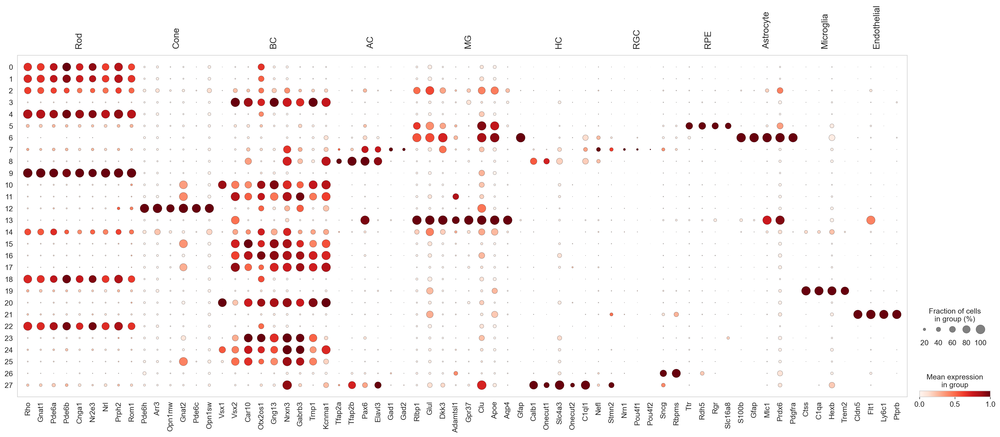

In [22]:
sc.pl.dotplot(
    adata,
    available_marker_genes,
    groupby="leiden_res_0.50",
    standard_scale="var",
)

## Save clustered object

In [23]:
adata.write(OUTPUT_H5AD)
print(f"Saved clustered AnnData: {OUTPUT_H5AD}")

Saved clustered AnnData: /Users/louis/Desktop/lab/code/scrna/retina_scRNA_TH1_TH2/data/interim/02_clustered.h5ad


## Review before next notebook

Before annotation and differential expression, review:

- whether `sample_id` and `condition` mix reasonably across UMAP
- whether high `doublet_score` cells cluster together
- whether any clusters look driven by `pct_counts_mt` or low complexity
- which `leiden_res_0.50` clusters correspond to rods, cones, and Muller glia

The next notebook should assign manual cell-type annotations and run `TH2` versus `TH1` differential expression inside rods/cones and Muller glia.